In [1]:
import pandas as pd
import seaborn as sns
import re
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path

In [2]:
id_season = {
        578: 2023,
        489: 2022,
        418: 2021,
        363: 2020,
        274: 2019,
        210: 2018,
        79: 2017,
        54: 2016,
        42: 2015,
        27: 2014,
        22: 2013,
        21: 2012,
        20: 2011,
        19: 2010,
        18: 2009,
        17: 2008,
        16: 2007,
        15: 2006,
        14: 2005,
        13: 2004,
        12: 2003,
        11: 2002,
        10: 2001,
        9: 2000,
        8: 1999,
        7: 1998,
        6: 1997,
        5: 1996,
        4: 1995,
        3: 1994,
        2: 1993,
        1: 1992}

In [3]:
path = '../../parsers/official/data/player_stat.csv'
df = pd.read_csv(Path(path).resolve())
pd.set_option('display.max_columns', None)
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,nationalTeam_isoCode,nationalTeam_country,nationalTeam_demonym,birth_date_millis,birth_date_label,birth_country_isoCode,birth_country_country,birth_country_demonym,birth_place,age,name_display,name_first,name_middle,name_last,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card
0,578,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 31 days,Max Aarons,Max,James,Aarons,19970.0,160.0,14.0,3.0,3.0,128.0,3.0,18.0,285.0,1.0,91.0,9.0,4.0,14.0,7.0,132.0,61.0,1.0,6.0,1.0,1.0,1.0,1.0,87.0,69.0,1.0,6.0,4.0,1.0,11.0,1.0,8.0,3.0,7.0,3.0,49.0,69.0,6.0,17.0,3.0,54.0,6.0,11.0,162.0,12.0,29.0,26.0,3.0,3.0,25.0,6.0,1.0,6.0,103.0,49.0,27.0,9.0,11.0,1084.0,3.0,2.0,5.0,374.0,5.0,4.0,13.0,106.0,1.0,26.0,2.0,155.0,155.0,5.0,43.0,21.0,24.0,32.0,73.0,275.0,4.0,18.0,7.0,203.0,37.0,17.0,23.0,11.0,11.0,112.0,1.0,192.0,16.0,46.0,2.0,384.0,1.0,1.0,3.0,2.0,28.0,2.0,105.0,651.0,12.0,11.0,11.0,25.0,0.0,2.0,12.0,2.0,18.0,1.0
1,418,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 31 days,Max Aarons,Max,James,Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0
2,274,344622.0,D,37.0,Right Full Back,False,GB-ENG,England,English,9.469440e+11,4 January 2000,GB-ENG,England,English,London,24 years 31 days,Max Aarons,Max,James,Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0,56.0,1

In [4]:
df[df['info_position'] == 'G']

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,nationalTeam_isoCode,nationalTeam_country,nationalTeam_demonym,birth_date_millis,birth_date_label,birth_country_isoCode,birth_country_country,birth_country_demonym,birth_place,age,name_display,name_first,name_middle,name_last,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card
10,363,161346.0,G,13.0,Goalkeeper,False,ES,Spain,Spanish,5.366304e+11,3 January 1987,ES,Spain,Spanish,Sevilla,37 years 32 days,Adrián,Adrián,NaN,San Miguel del Castillo,4852.0,54.0,5.0,NaN,NaN,6.0,4.0,10.0,60.0,NaN,NaN,NaN,1.0,3.0,NaN,24.0,13.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.0,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,1.0,NaN,1.0,NaN,6.0,NaN,5.0,NaN,NaN,32.0,3.0,9.0,7.0,2.0,NaN,NaN,NaN,NaN,NaN,26.0,19.0,6.0,1.0,4.0,270.0,NaN,NaN,NaN,50.0,NaN,NaN,5.0,3.0,NaN,NaN,NaN,22.0,22.0,NaN,2.0,NaN,NaN,22.0,NaN,36.0,NaN,0.0,NaN,61.0,7.0,6.0,NaN,NaN,NaN,5.0,NaN,19.0,17.0,27.0,NaN,80.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,116.0,NaN,NaN,NaN,NaN,0.0,1.0,NaN,NaN,NaN,NaN
11,274,161346.0,G,13.0,Goalkeeper,False,ES,Spain,Spanish,5.366304e+11,3 January 1987,ES,Spain,Spanish,Sevilla,37 years 32 days,Adrián,Adrián,NaN,San Miguel del Castillo,4852.0,174.0,24.0,NaN,NaN,13.0,10.0,50.0,187.0,NaN,NaN,NaN,4.0,11.0,NaN,58.0,35.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,73.0,NaN,NaN,1.0,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,6.0,NaN,12.0,1.0,12.0,NaN,NaN,132.0,9.0,10.0,8.0,2.0,1.0,1.0,NaN,NaN,NaN,62.0,61.0,13.0,NaN,4.0,873.0,0.0,NaN,NaN,152.0,NaN,NaN,13.0,12.0,NaN,0.0,NaN,73.0,73.0,NaN,5.0,NaN,1.0,66.0,3.0,109.0,NaN,NaN,NaN,199.0,40.0,12.0,NaN,NaN,NaN,12.0,NaN,61.0,47.0,121.0,NaN,260.0,NaN,NaN,NaN,2.0,1.0,NaN,NaN,354.0,NaN,NaN,NaN,1.0,NaN,11.0,NaN,NaN,1.0,1.0
12,79,161346.0,G,13.0,Goalkeeper,False,ES,Spain,Spanish,5.366304e+11,3 January 1987,ES,Spain,Spanish,Sevilla,37 years 32 days,Adrián,Adrián,NaN,San Miguel del Castillo,4852.0,91.0,11.0,NaN,NaN,130.0,54.0,174.0,221.0,NaN,0.0,1.0,3.0,19.0,1.0,171.0,140.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,180.0,NaN,NaN,1.0,NaN,3.0,6.0,NaN,NaN,NaN,6.0,5.0,7.0,NaN,21.0,0.0,103.0,NaN,1.0,472.0,19.0,29.0,23.0,6.0,0.0,NaN,0.0,0.0,0.0,29.0,382.0,130.0,6.0,16.0,1710.0,NaN,NaN,NaN,201.0,0.0,NaN,28

In [5]:
df.shape

(2453, 133)

In [6]:
#Удаляем колонки в которых информация дублируется либо информация бесполезна
df.drop(['nationalTeam_isoCode',
         'nationalTeam_demonym',
         'nationalTeam_country', 
         'birth_country_isoCode', 
         'birth_country_demonym',
         'birth_date_millis',
         'name_first',
         'name_middle',
         'name_last'
         ], axis=1, inplace=True)

In [7]:
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2453 entries, 0 to 2452
Data columns (total 124 columns):
 #    Column                          Non-Null Count  Dtype  
---   ------                          --------------  -----  
 0    season_id                       2453 non-null   int64  
 1    playerId                        2453 non-null   float64
 2    info_position                   2453 non-null   object 
 3    info_shirtNum                   2172 non-null   float64
 4    info_positionInfo               2453 non-null   object 
 5    info_loan                       2453 non-null   bool   
 6    birth_date_label                2453 non-null   object 
 7    birth_country_country           2453 non-null   object 
 8    birth_place                     1578 non-null   object 
 9    age                             2453 non-null   object 
 10   name_display                    2453 non-null   object 
 11   id                              2453 non-null   float64
 12   _accurate_back_zon

In [8]:
col = df.columns
for i in col:
    if df[i].dtypes == float:
        print(f'{i}: mean: {int(df[i].mean())}, min: {df[i].min()}, max: {df[i].max()}, na: {df[i].isna().sum()}')

playerId: mean: 259901, min: 6011.0, max: 356866.0, na: 0
info_shirtNum: mean: 16, min: 1.0, max: 98.0, na: 281
id: mean: 21841, min: 2100.0, max: 140364.0, na: 0
_accurate_back_zone_pass: mean: 283, min: 0.0, max: 2008.0, na: 73
_accurate_chipped_pass: mean: 30, min: 0.0, max: 252.0, na: 250
_accurate_cross: mean: 10, min: 0.0, max: 135.0, na: 882
_accurate_cross_nocorner: mean: 7, min: 0.0, max: 70.0, na: 902
_accurate_fwd_zone_pass: mean: 303, min: 0.0, max: 1707.0, na: 66
_accurate_launches: mean: 10, min: 0.0, max: 219.0, na: 788
_accurate_long_balls: mean: 46, min: 0.0, max: 410.0, na: 242
_accurate_pass: mean: 573, min: 0.0, max: 2903.0, na: 43
_accurate_through_ball: mean: 2, min: 0.0, max: 23.0, na: 1480
_accurate_throws: mean: 35, min: 0.0, max: 460.0, na: 680
_aerial_lost: mean: 26, min: 0.0, max: 245.0, na: 279
_aerial_won: mean: 26, min: 0.0, max: 240.0, na: 258
_appearances: mean: 20, min: 0.0, max: 38.0, na: 18
_attempted_tackle_foul: mean: 10, min: 0.0, max: 48.0, na: 3

In [9]:
df['season'] = df['season_id'].apply(lambda x: id_season[x])

In [10]:
#Возраст у игрока в каждом сезоне одинаковый, исправим это
df['age'] = df['season'] - df['birth_date_label'].apply(lambda x: int(x.split()[-1]))

In [11]:
df.shape

(2453, 125)

In [12]:
#Удалим строки с большим количеством пропусков
"""df.dropna(thresh=62, inplace=True)
df.shape"""

'df.dropna(thresh=62, inplace=True)\ndf.shape'

In [13]:
#Удалим колонки, в которых  более 30% пропусков
"""df.dropna(thresh=1700, axis=1, inplace=True)
df.shape"""

'df.dropna(thresh=1700, axis=1, inplace=True)\ndf.shape'

In [14]:
df.columns

Index(['season_id', 'playerId', 'info_position', 'info_shirtNum',
       'info_positionInfo', 'info_loan', 'birth_date_label',
       'birth_country_country', 'birth_place', 'age',
       ...
       '_turnover', '_unsuccessful_touch', '_was_fouled', '_winning_goal',
       '_wins', '_won_contest', '_won_corners', '_won_tackle', '_yellow_card',
       'season'],
      dtype='object', length=125)

In [15]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']] #appearances = wins + losses + draws

,_wins,_losses,_game_started,_draws,_appearances
0,2.0,9.0,12.0,3.0,14.0
1,4.0,24.0,32.0,6.0,34.0
2,4.0,26.0,36.0,6.0,36.0
3,NaN,1.0,NaN,NaN,1.0
4,5.0,11.0,24.0,8.0,24.0
...,...,...,...,...,...
2448,10.0,NaN,7.0,5.0,15.0
2449,12.0,3.0,19.0,4.0,19.0
2450,25.0,6.0,37.0,6.0,37.0
2451,22.0,11.0,32.0,3.0,36.0


In [16]:
df[['_wins', '_losses', '_game_started', '_draws', '_appearances']].isna().sum()

_wins            187
_losses          174
_game_started    242
_draws           304
_appearances      18
dtype: int64

In [17]:
df_temp = df[['_wins', '_losses', '_draws', '_appearances']]
df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)
df_temp

/tmp/ipykernel_32378/807101919.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_temp['sum_'] = df_temp['_losses'].fillna(0) + df_temp['_draws'].fillna(0) + df_temp['_wins'].fillna(0)


,_wins,_losses,_draws,_appearances,sum_
0,2.0,9.0,3.0,14.0,14.0
1,4.0,24.0,6.0,34.0,34.0
2,4.0,26.0,6.0,36.0,36.0
3,NaN,1.0,NaN,1.0,1.0
4,5.0,11.0,8.0,24.0,24.0
...,...,...,...,...,...
2448,10.0,NaN,5.0,15.0,15.0
2449,12.0,3.0,4.0,19.0,19.0
2450,25.0,6.0,6.0,37.0,37.0
2451,22.0,11.0,3.0,36.0,36.0


In [18]:
#Проверим гипотезу, что наны в этих колонка - нули
df_temp[df_temp['_appearances'] != df_temp['sum_']]

,_wins,_losses,_draws,_appearances,sum_
25,NaN,NaN,NaN,NaN,0.0
110,8.0,17.0,4.0,30.0,29.0
142,8.0,7.0,8.0,24.0,23.0
245,NaN,NaN,NaN,NaN,0.0
265,5.0,3.0,2.0,11.0,10.0
316,NaN,NaN,NaN,NaN,0.0
395,NaN,NaN,NaN,NaN,0.0
402,10.0,17.0,4.0,32.0,31.0
485,NaN,NaN,NaN,NaN,0.0
518,NaN,NaN,NaN,NaN,0.0


В нескольких строках наша гипотезу не подтвердилась, но разница везде в 1 матч, видимо это ошибка в данных. Но самое главное нет ни одной строки с нанами, которые мы заменили на нули, поэтому смело меняем наны в этих колонках на нули

In [19]:
df[['_wins', '_losses', '_draws', '_appearances']] = df[['_wins', '_losses', '_draws', '_appearances']].fillna(0)

In [20]:
df['per_wins'] = df['_wins'] / df['_appearances']

In [21]:
df[['_wins', '_losses', '_draws', '_appearances']].loc[4]

_wins            5.0
_losses         11.0
_draws           8.0
_appearances    24.0
Name: 4, dtype: float64

In [22]:
df.head()

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
0,578,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,23,Max Aarons,19970.0,160.0,14.0,3.0,3.0,128.0,3.0,18.0,285.0,1.0,91.0,9.0,4.0,14.0,7.0,132.0,61.0,1.0,6.0,1.0,1.0,1.0,1.0,87.0,69.0,1.0,6.0,4.0,1.0,11.0,1.0,8.0,3.0,7.0,3.0,49.0,69.0,6.0,17.0,3.0,54.0,6.0,11.0,162.0,12.0,29.0,26.0,3.0,3.0,25.0,6.0,1.0,6.0,103.0,49.0,27.0,9.0,11.0,1084.0,3.0,2.0,5.0,374.0,5.0,4.0,13.0,106.0,1.0,26.0,2.0,155.0,155.0,5.0,43.0,21.0,24.0,32.0,73.0,275.0,4.0,18.0,7.0,203.0,37.0,17.0,23.0,11.0,11.0,112.0,1.0,192.0,16.0,46.0,2.0,384.0,1.0,1.0,3.0,2.0,28.0,2.0,105.0,651.0,12.0,11.0,11.0,25.0,0.0,2.0,12.0,2.0,18.0,1.0,2023,0.142857
1,418,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,21,Max Aarons,19970.0,461.0,23.0,9.0,9.0,395.0,10.0,36.0,847.0,2.0,251.0,50.0,14.0,34.0,5.0,336.0,179.0,6.0,17.0,8.0,1.0,6.0,13.0,219.0,154.0,2.0,25.0,60.0,6.0,18.0,4.0,33.0,17.0,23.0,6.0,151.0,163.0,25.0,71.0,32.0,134.0,6.0,27.0,456.0,32.0,69.0,62.0,7.0,32.0,47.0,28.0,4.0,28.0,367.0,157.0,71.0,24.0,39.0,2882.0,15.0,10.0,10.0,1080.0,19.0,13.0,11.0,335.0,2.0,93.0,6.0,470.0,470.0,5.0,110.0,39.0,60.0,55.0,211.0,833.0,20.0,57.0,20.0,555.0,80.0,71.0,68.0,50.0,50.0,308.0,2.0,592.0,67.0,141.0,1.0,1097.0,1.0,13.0,3.0,2.0,64.0,5.0,315.0,1962.0,26.0,38.0,38.0,52.0,0.0,4.0,34.0,12.0,44.0,8.0,2021,0.117647
2,274,344622.0,D,37.0,Right Full Back,False,4 January 2000,England,London,19,Max Aarons,19970.0,570.0,23.0,16.0,16.0,502.0,12.0,38.0,1056.0,NaN,260.0,50.0,22.0,36.0,12.0,384.0,188.0,3.0,22.0,3.0,2.0,3.0,13.0,352.0,178.0,7.0,24.0,82.0,6.0,18.0,5.0,56.0,17.0,31.0,6.0,175.0,167.0,24.0,73.0,28.0,112.0,13.0,29.0,476.0,36.0,71.0,63.0,8.0,28.0,62.0,37.0,10.0,37.0,456.0,130.0,53.0,26.0,40.0,3240.0,7.0,13.0,10.0,1316.0,29.0,14.0,24.0,410.0,NaN,77.0,4.0,530.0,530.0,5.0,126.0,47.0,82.0,55.0,250.0,1035.0,17.0,NaN,23.0,694.0,78.0,73.0,99.0,73.0,73.0,331.0,3.0,718.0,93.0,153.0,3.0,1339.0,4.0,14.0,NaN,NaN,48.0,NaN,299.0,

Теперь наша гипотеза, что все наны в датасете являются нулями. Для начала сгруппируем датасет по сезонам и посмотрим есть ли зависимость года от пропусков

In [23]:
df_gr = df.groupby(by='season_id').agg(['count', 'size'])
df_gr

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27              76   76            76   76            67   76   
42             101  101           101  101            89  101   
54             112  112           112  112           102  112   
79             153  153           153  153           135  153   
210            191  191           191  191           168  191   
274            248  248           248  248           217  248   
363            301  301           301  301           266  301   
418            340  340           340  340           306  340   
489            436  436           436  436           387  436   
578            495  495           495  495           435  495   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                       76   76        76   76               76   76   
42                      101  101       101  101              101  101   
54                      112  112       112  112              112  112   
79                      153  153       153  153              153  153   
210                     191  191       191  191              191  191   
274                     248  248       248  248              248  248   
363                     301  301       301  301              301  301   
418                     340  340       340  340              340  340   
489                     436  436       436  436              436  436   
578                     495  495       495  495              495  495   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                           76   76          47   76    76   76           76   
42                          101  101          68  101   101  101          101   
54                          112  112          79  112   112  112          112   
79                          153  153         104  153   153  153          153   
210                         191  191         126  191   191  191          191   
274                         248  248         160  248   248  248          248   
363                         301  301         197  301   301  301          301   
418                         340  340         228  340   340  340          340   
489                         436  436         282  436   436  436          436   
578                         495  495         287  495   495  495          495   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76    76   76                       69   76   
42         101   101  101                       91  101   
54         112   112  112                      111  112   
79         153   153  153                      151  153   
210        191   191  191                      185  191   
274        248   248  248                      246  248   
363        301   301  301                      292  301   
418        340   340  340                      332  340   
489        436   436  436                      425  436   
578        495   495  495                      478  495   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                            64   76              45   76   
42                            86  101              65  101   
54                           107  112              82  112   
79                  

In [24]:
#Не знаю как тут обойтись без цикла, в цикле считаем отношение размера признака от количества данных (1.0 - пропусков нет), записываем информацию в count
for i in range(0, df_gr.shape[1], 2):
    df_gr.iloc[:, i] = df_gr.iloc[:, i] / df_gr.iloc[:, i+1]

df_gr

playerId      info_position      info_shirtNum       \
             count size         count size         count size   
season_id                                                       
27             1.0   76           1.0   76      0.881579   76   
42             1.0  101           1.0  101      0.881188  101   
54             1.0  112           1.0  112      0.910714  112   
79             1.0  153           1.0  153      0.882353  153   
210            1.0  191           1.0  191      0.879581  191   
274            1.0  248           1.0  248      0.875000  248   
363            1.0  301           1.0  301      0.883721  301   
418            1.0  340           1.0  340      0.900000  340   
489            1.0  436           1.0  436      0.887615  436   
578            1.0  495           1.0  495      0.878788  495   

          info_positionInfo      info_loan      birth_date_label       \
                      count size     count size            count size   
season_id                                                               
27                      1.0   76       1.0   76              1.0   76   
42                      1.0  101       1.0  101              1.0  101   
54                      1.0  112       1.0  112              1.0  112   
79                      1.0  153       1.0  153              1.0  153   
210                     1.0  191       1.0  191              1.0  191   
274                     1.0  248       1.0  248              1.0  248   
363                     1.0  301       1.0  301              1.0  301   
418                     1.0  340       1.0  340              1.0  340   
489                     1.0  436       1.0  436              1.0  436   
578                     1.0  495       1.0  495              1.0  495   

          birth_country_country      birth_place        age      name_display  \
                          count size       count size count size        count   
season_id                                                                       
27                          1.0   76    0.618421   76   1.0   76          1.0   
42                          1.0  101    0.673267  101   1.0  101          1.0   
54                          1.0  112    0.705357  112   1.0  112          1.0   
79                          1.0  153    0.679739  153   1.0  153          1.0   
210                         1.0  191    0.659686  191   1.0  191          1.0   
274                         1.0  248    0.645161  248   1.0  248          1.0   
363                         1.0  301    0.654485  301   1.0  301          1.0   
418                         1.0  340    0.670588  340   1.0  340          1.0   
489                         1.0  436    0.646789  436   1.0  436          1.0   
578                         1.0  495    0.579798  495   1.0  495          1.0   

                  id      _accurate_back_zone_pass       \
          size count size                    count size   
season_id                                                 
27          76   1.0   76                 0.907895   76   
42         101   1.0  101                 0.900990  101   
54         112   1.0  112                 0.991071  112   
79         153   1.0  153                 0.986928  153   
210        191   1.0  191                 0.968586  191   
274        248   1.0  248                 0.991935  248   
363        301   1.0  301                 0.970100  301   
418        340   1.0  340                 0.976471  340   
489        436   1.0  436                 0.974771  436   
578        495   1.0  495                 0.965657  495   

          _accurate_chipped_pass      _accurate_cross       \
                           count size           count size   
season_id                                                    
27                      0.842105   76        0.592105   76   
42                      0.851485  101        0.643564  101   
54                      0.955357  112        0.732143  112   
79                  

Зависимости в в соотношении пропущеных значений по сезонам не выявлено, только в 3 колонках есть сильное различие :
_winning_goal
_attempts_obox
_times_tackled

In [25]:
(df['_winning_goal']==0).sum()

1362

In [26]:
df['_attempts_obox'].isna().sum()

827

In [27]:
df['_times_tackled'].isna().sum()

587

In [28]:
df[df['info_shirtNum'].isna()]

,season_id,playerId,info_position,info_shirtNum,info_positionInfo,info_loan,birth_date_label,birth_country_country,birth_place,age,name_display,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
18,578,356650.0,M,NaN,Midfielder,True,28 June 2003,Costa Rica,NaN,20,Brandon Aguilera,134486.0,1.0,NaN,NaN,NaN,3.0,NaN,NaN,4.0,NaN,NaN,NaN,NaN,1.0,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,3.0,NaN,NaN,NaN,NaN,1.0,NaN,3.0,5.0,NaN,NaN,NaN,NaN,NaN,3.0,NaN,NaN,NaN,1.0,NaN,NaN,1.0,NaN,4.0,NaN,NaN,NaN,8.0,NaN,1.0,NaN,2.0,NaN,1.0,NaN,5.0,5.0,NaN,NaN,NaN,1.0,1.0,2.0,4.0,NaN,0.0,NaN,2.0,1.0,NaN,NaN,NaN,NaN,3.0,0.0,6.0,NaN,NaN,NaN,8.0,NaN,NaN,NaN,1.0,NaN,NaN,NaN,11.0,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN,2023,0.000000
19,578,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,21,Naouirou Ahamada,68086.0,21.0,1.0,NaN,NaN,44.0,1.0,2.0,65.0,NaN,2.0,NaN,2.0,12.0,4.0,24.0,10.0,3.0,1.0,NaN,2.0,3.0,3.0,14.0,16.0,NaN,NaN,1.0,2.0,4.0,NaN,4.0,1.0,4.0,2.0,14.0,12.0,NaN,2.0,NaN,3.0,NaN,4.0,20.0,NaN,8.0,7.0,1.0,NaN,3.0,1.0,NaN,1.0,20.0,4.0,4.0,9.0,NaN,148.0,NaN,1.0,NaN,76.0,NaN,NaN,9.0,19.0,NaN,3.0,1.0,28.0,28.0,NaN,7.0,9.0,7.0,23.0,24.0,64.0,1.0,6.0,1.0,25.0,3.0,2.0,6.0,5.0,5.0,31.0,1.0,57.0,2.0,3.0,NaN,77.0,NaN,3.0,NaN,12.0,3.0,NaN,2.0,117.0,1.0,5.0,5.0,4.0,0.0,1.0,4.0,1.0,2.0,1.0,2023,0.083333
20,489,351454.0,M,NaN,Midfielder,False,29 March 2002,France,Marseille,20,Naouirou Ahamada,68086.0,16.0,NaN,NaN,NaN,21.0,1.0,1.0,37.0,NaN,NaN,1.0,NaN,8.0,1.0,8.0,4.0,NaN,1.0,1.0,NaN,NaN,2.0,8.0,8.0,NaN,NaN,2.0,0.0,2.0,NaN,2.0,NaN,1.0,3.0,7.0,4.0,NaN,NaN,NaN,4.0,NaN,2.0,11.0,NaN,2.0,2.0,NaN,NaN,4.0,NaN,NaN,NaN,19.0,5.0,3.0,5.0,NaN,87.0,NaN,0.0,1.0,43.0,NaN,1.0,5.0,8.0,NaN,1.0,1.0,17.0,17.0,NaN,4.0,4.0,2.0,6.0,10.0,36.0,2.0,2.0,1.0,18.0,NaN,NaN,2.0,2.0,2.0,11.0,1.0,28.0,1.0,2.0,2.0,44.0,NaN,3.0,NaN,8.0,3.0,NaN,NaN,66.0,4.0,5.0,5.0,NaN,0.0,0.0,1.0,1.0,2.0,1.0,2022,0.000000
52,578,30533.0,D,NaN,Right Full Back,False,7 October 1998,England,Liverpool,25,Trent Alexander-Arnold,14732.0,408.0,100.0,36.0,15.0,562.0,7.0,103.0,934.0,7.0,113.0,4.0,7.0,19.0,3.0,114.0,61.0,21.0,27.0,4.

In [29]:
df.describe()

,season_id,playerId,info_shirtNum,age,id,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
count,2453.000000,2453.000000,2172.000000,2453.000000,2453.000000,2380.000000,2203.000000,1571.000000,1551.000000,2387.000000,1665.000000,2211.000000,2410.000000,973.000000,1773.000000,2174.000000,2195.000000,2453.000000,2060.000000,2379.000000,2343.000000,1626.00000,2005.000000,1663.000000,1426.000000,1729.000000,1893.000000,2242.000000,2349.000000,1498.000000,1490.000000,2149.000000,1816.000000,2108.000000,1712.000000,1792.000000,1669.000000,2047.000000,2453.000000,2304.000000,2335.000000,1490.000000,2216.000000,1985.000000,2326.000000,1540.000000,2132.000000,2375.000000,2211.000000,2293.00000,2283.000000,1899.000000,1986.000000,2185.000000,2070.000000,1310.000000,2070.000000,2361.000000,2294.000000,2250.000000,2453.000000,1975.000000,2434.000000,1201.000000,1809.000000,1966.000000,2415.000000,1725.000000,1417.000000,2307.000000,2323.000000,418.000000,2223.000000,1654.000000,2399.000000,2399.000000,1845.000000,2277.000000,2154.000000,2201.000000,2361.000000,2352.000000,2407.000000,2056.000000,1866.000000,2037.000000,2389.000000,2262.000000,2216.000000,2098.000000,1922.000000,1914.000000,2389.000000,1765.000000,2408.000000,2107.000000,2274.000000,1344.000000,2416.000000,1007.000000,2027.000000,1844.000000,1881.000000,2167.000000,1337.000000,1793.000000,2426.000000,1999.000000,2179.000000,2179.000000,2190.000000,1866.000000,2453.000000,2024.000000,1909.000000,2114.000000,1795.000000,2453.000000,2434.000000
mean,360.044028,259901.409702,16.962247,25.140644,21841.018345,283.514706,30.191557,10.527689,7.125081,303.002095,10.244444,46.596563,573.232365,2.386434,35.730964,26.665593,26.568109,20.512841,10.230583,133.448928,77.457106,10.04551,13.760100,9.091401,4.366760,10.243493,18.514527,118.438002,96.308216,3.751669,4.375168,25.468125,7.497247,15.458729,5.095794,17.687500,10.174955,17.857352,4.650224,82.256944,82.145182,4.375839,32.459386,18.628212,91.147463,5.442857,17.504690,250.983579,18.416101,23.35543,20.417433,3.654555,18.765861,55.655835,18.240580,3.161832,18.240580,181.866582,110.537053,62.386

Много пропусков в признаках, где низкие значения (низкое среднее, максимальное), т.е там где должно быть много нулей

<AxesSubplot:xlabel='age', ylabel='Count'>

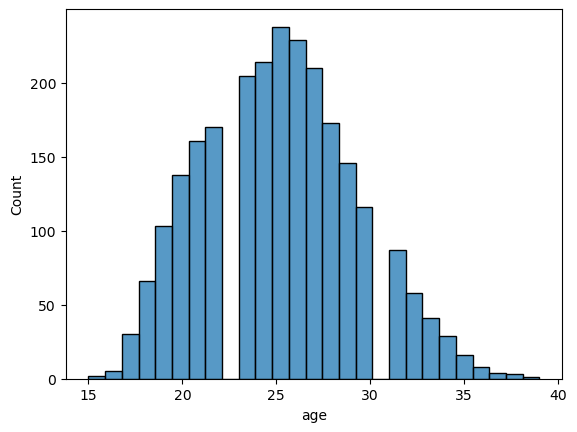

In [30]:
sns.histplot(df['age'])

<AxesSubplot:xlabel='info_position', ylabel='Count'>

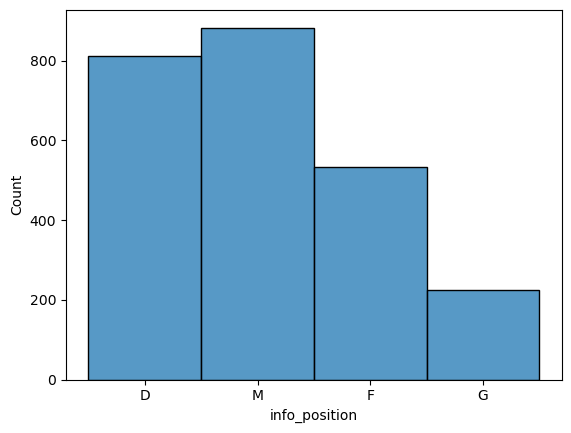

In [31]:
sns.histplot(df['info_position'])

In [32]:
#Топ 10 стран по количеству игроков в лиге
df.groupby(by='birth_country_country')['name_display'].count().sort_values(ascending=False).iloc[:10] 

birth_country_country
England        1046
France          174
Brazil          157
Spain            92
Portugal         87
Germany          68
Netherlands      63
Belgium          62
Ireland          61
Scotland         50
Name: name_display, dtype: int64

In [33]:
pd.set_option('display.max_rows', None)

In [34]:
df.iloc[:, 12:].corr()

,_accurate_back_zone_pass,_accurate_chipped_pass,_accurate_cross,_accurate_cross_nocorner,_accurate_fwd_zone_pass,_accurate_launches,_accurate_long_balls,_accurate_pass,_accurate_through_ball,_accurate_throws,_aerial_lost,_aerial_won,_appearances,_attempted_tackle_foul,_attempts_conceded_ibox,_attempts_conceded_obox,_attempts_obox,_att_assist_openplay,_att_lf_total,_att_obox_blocked,_att_obx_centre,_att_openplay,_backward_pass,_ball_recovery,_big_chance_created,_blocked_cross,_blocked_pass,_blocked_scoring_att,_challenge_lost,_clean_sheet,_crosses_18yard,_crosses_18yardplus,_dispossessed,_draws,_duel_lost,_duel_won,_effective_blocked_cross,_effective_clearance,_effective_head_clearance,_final_third_entries,_fouled_final_third,_fouls,_fwd_pass,_game_started,_goals_conceded,_goals_conceded_ibox,_goals_conceded_obox,_head_clearance,_head_pass,_interception,_interceptions_in_box,_interception_won,_leftside_pass,_long_pass_own_to_opp,_long_pass_own_to_opp_success,_losses,_lost_corners,_mins_played,_offside_provoked,_offtarget_att_assist,_ontarget_att_assist,_open_play_pass,_outfielder_block,_overrun,_passes_left,_passes_right,_penalty_conceded,_pen_area_entries,_pen_goals_conceded,_poss_lost_all,_poss_lost_ctrl,_poss_won_att_3rd,_poss_won_def_3rd,_poss_won_mid_3rd,_put_through,_rightside_pass,_successful_final_third_passes,_successful_open_play_pass,_successful_put_through,_times_tackled,_total_att_assist,_total_back_zone_pass,_total_chipped_pass,_total_clearance,_total_contest,_total_cross,_total_cross_nocorner,_total_final_third_passes,_total_flick_on,_total_fwd_zone_pass,_total_launches,_total_long_balls,_total_offside,_total_pass,_total_pull_back,_total_scoring_att,_total_sub_off,_total_sub_on,_total_tackle,_total_through_ball,_total_throws,_touches,_touches_in_opp_box,_turnover,_unsuccessful_touch,_was_fouled,_winning_goal,_wins,_won_contest,_won_corners,_won_tackle,_yellow_card,season,per_wins
_accurate_back_zone_pass,1.000000,0.739079,0.127366,0.124041,0.615346,0.056696,0.565526,0.909411,0.036959,0.149084,0.185168,0.491478,0.573188,0.328616,0.564912,0.505920,0.109057,0.078543,-0.112982,0.112115,0.107263,-0.141623,0.368876,0.657622,0.002151,0.130752,0.244850,-0.054221,0.289169,0.617760,0.061557,0.139494,-0.094877,0.419842,0.169413,0.464229,0.130884,0.656074,0.583252,0.696728,-0.124227,0.338788,0.823881,0.630396,0.523067,0.520651,0.266983,0.580664,0.648434,0.606679,0.441055,0.606679,0.823966,0.657540,0.838172,0.307968,0.546859,0.669348,0.639194,0.070301,0.065464,0.886925,0.612449,-0.110432,0.461527,0.460894,0.166422,0.166463,0.258853,0.421516,0.421476,0.017376,0.770629,0.580012,0.253688,0.813164,0.389537,0.896831,0.269507,-0.062710,0.086493,0.998191,0.738428,0.651468,-0.076036,0.100713,0.093130,0.435779,-0.151460,0.608666,0.211894,0.460918,-0.229436,0.897892,0.006881,-0.000842,-0.148639,-0.224444,0.490114,0.073693,0.141477,0.819343,-0.058271,-0.066192,-0.066192,0.108064,-0.006280,0.537428,-0.029238,-0.053677,0.452594,0.357082,-0.080124,0.151479
_accurate_chipped_pass,0.739079,1.000000,0.386446,0.334777,0.609352,0.099044,0.688766,0.757309,0.269504,0.176420,0.106553,0.294906,0.550272,0.387688,0.554727,0.505056,0.386476,0.277594,0.018335,0.373323,0.384975,0.049398,0.368056,0.682745,0.243505,0.150971,0.334056,0.162367,0.436906,0.546067,0.183897,0.394661,0.013828,0.400476,0.184279,0.375717,0.151089,0.430396,0.352473,0.789920,-0.029403,0.344075,0.755079,0.626937,0.519238,0.516355,0.297099,0.350954,0.477706,0.529414,0.311803,0.529414,0.683832,0.630834,0.711280,0.297375,0.423481,0.641631,0.346595,0.348413,0.299679,0.752848,0.424170,-0.036388,0.456966,0.472320,0.055388,0.414920,0.239576,0.541750,0.542148,0.239110,0.642303,0.605814,0.331068,0.651302,0.475669,0.730396,0.351800,-0.036037,0.325473,0.748379,0.969145,0.427460,0.025832,0.354615,0.309924,0.552225,-0.084441,0.660431,0.241976,0.566271,-0.163683,0.786867,0.014055,0.172153,-0.034238,-0.235265,0.467497,0.317256,0.169121,0.751719,-0.002392,0.009895,0.009895,0.143704,0.019221,0.47013

/home/chewye/anaconda3/lib/python3.9/site-packages/seaborn/axisgrid.py:1280: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=figsize)


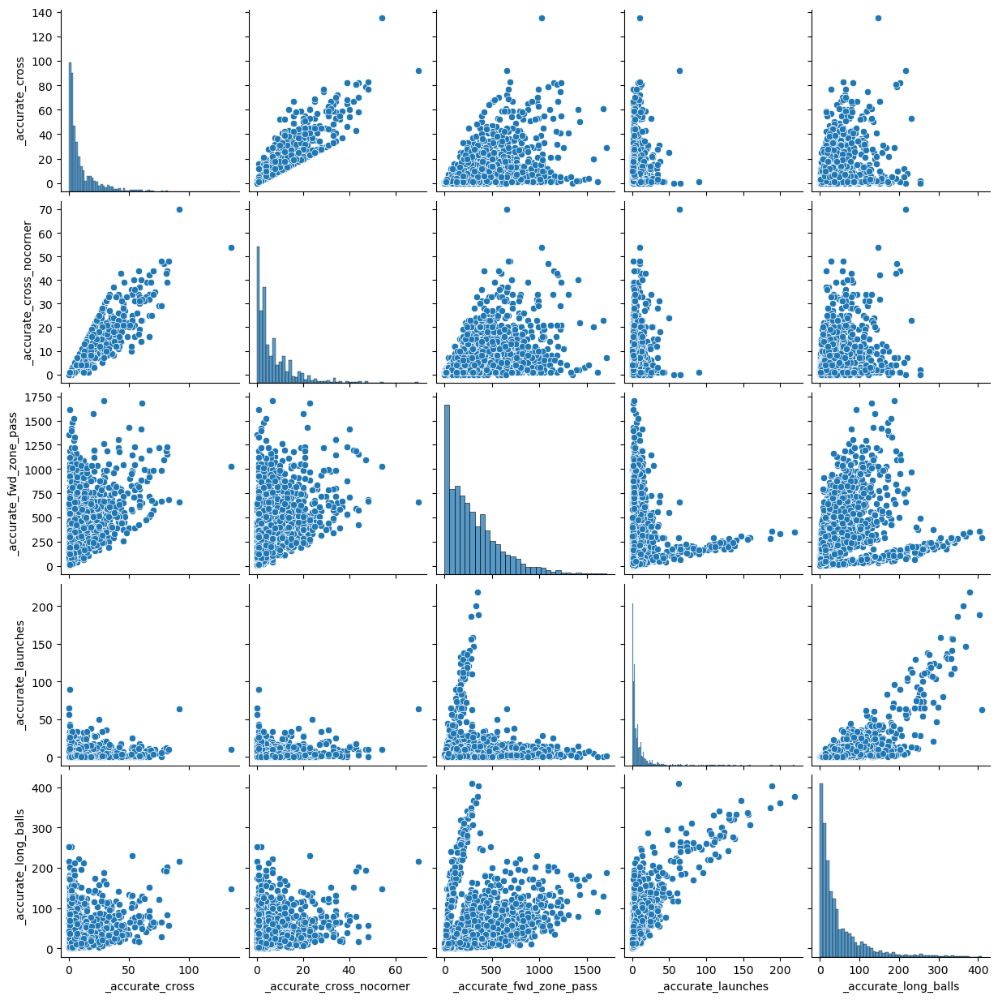

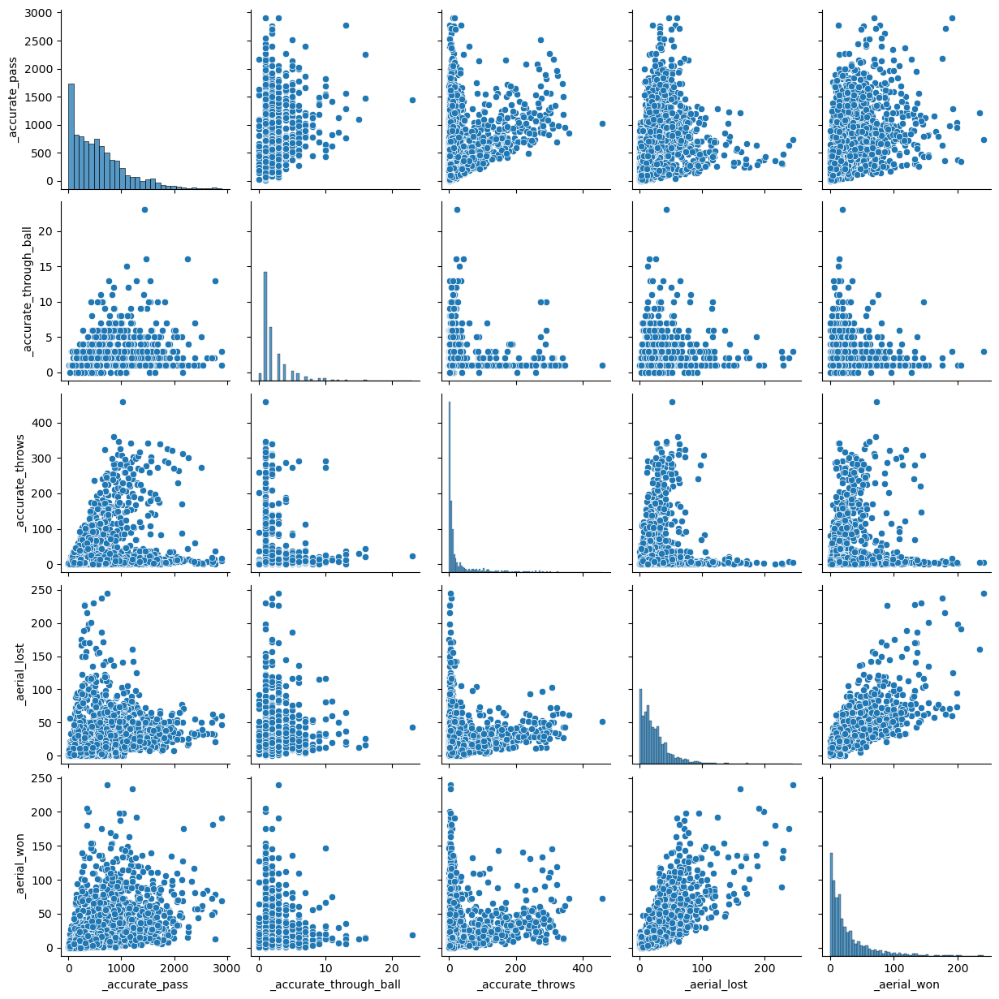

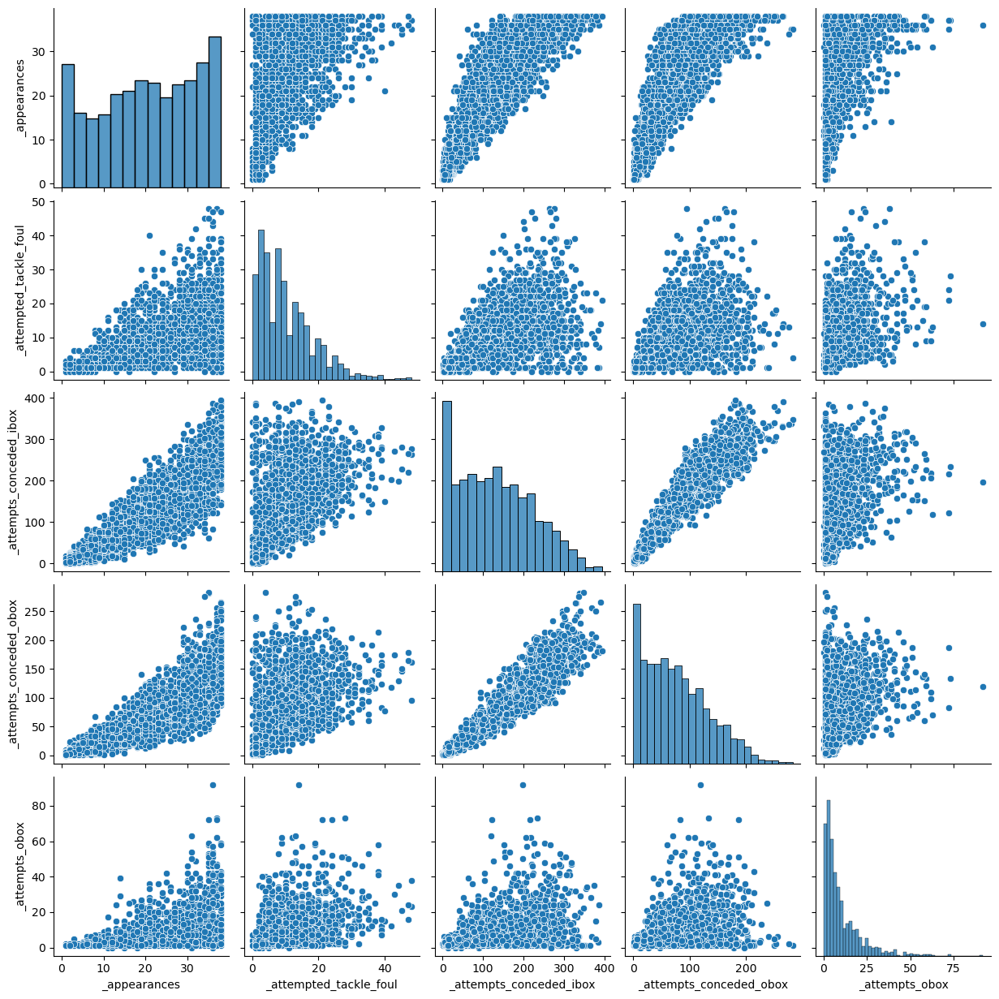

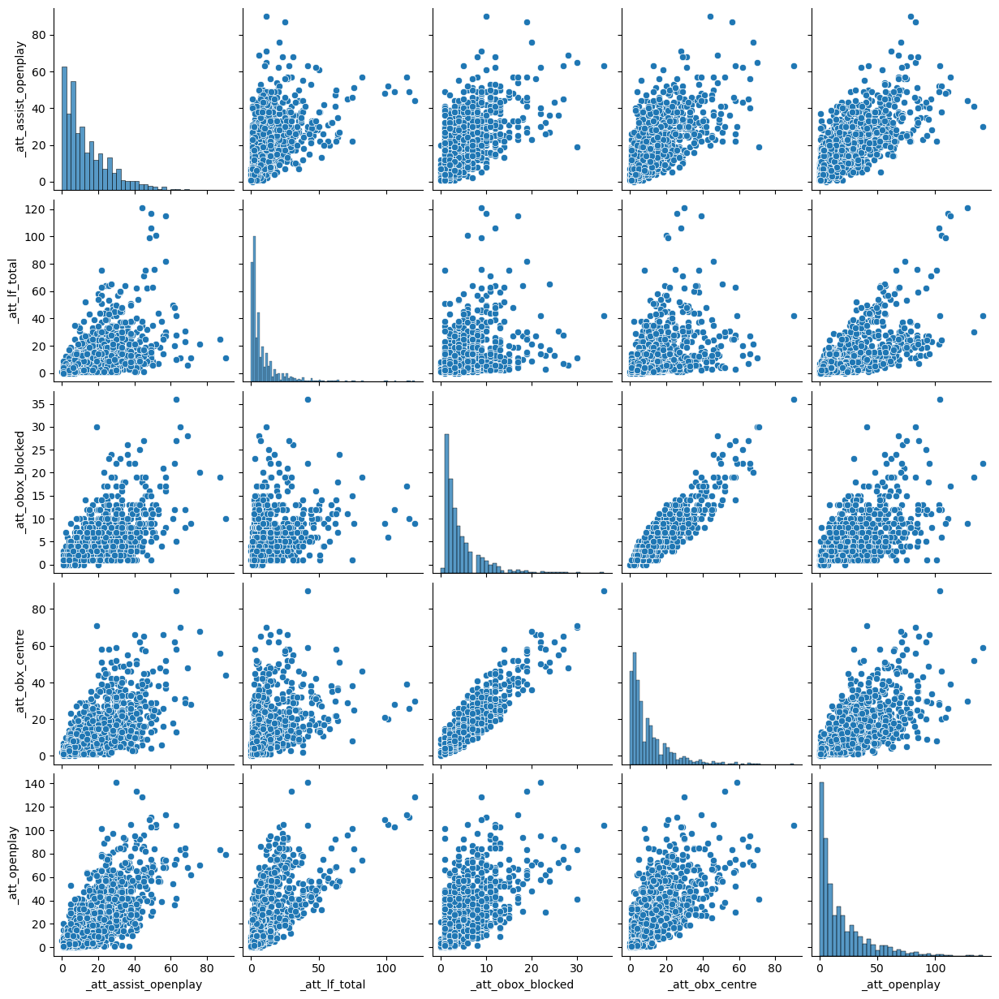

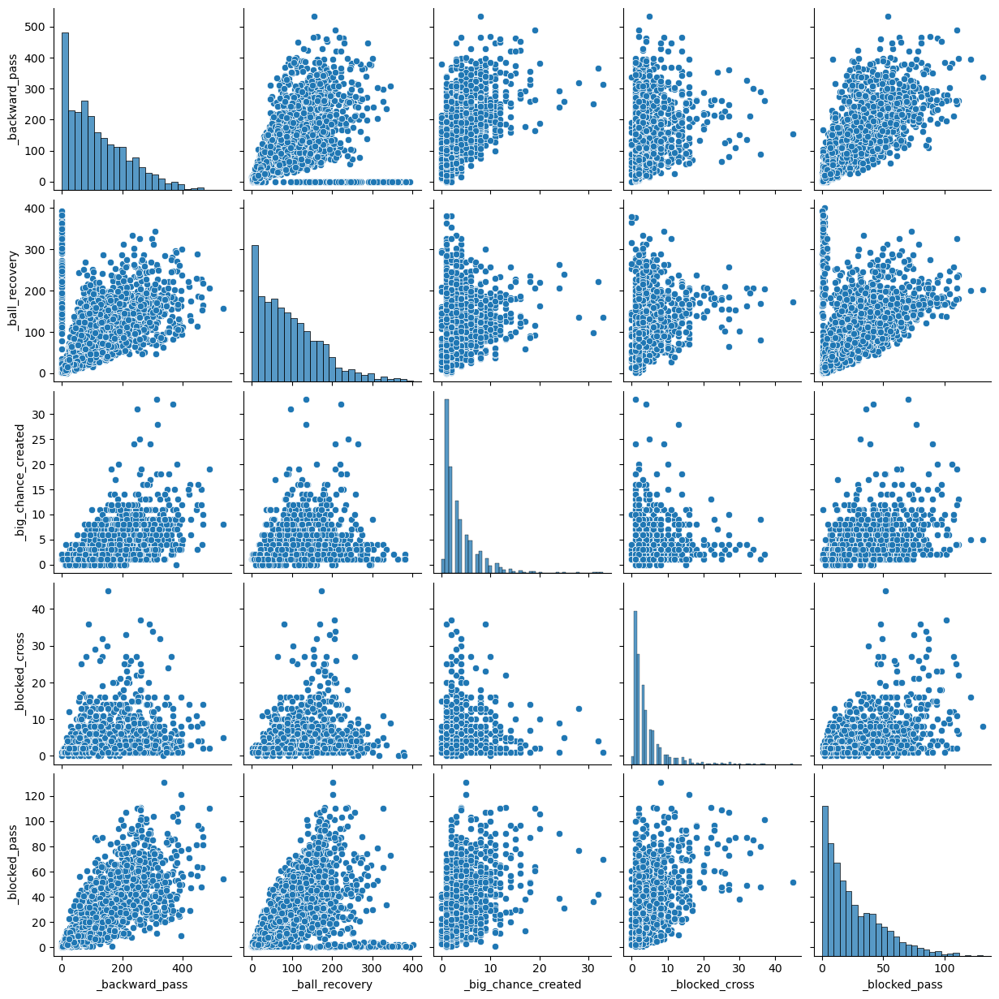

...

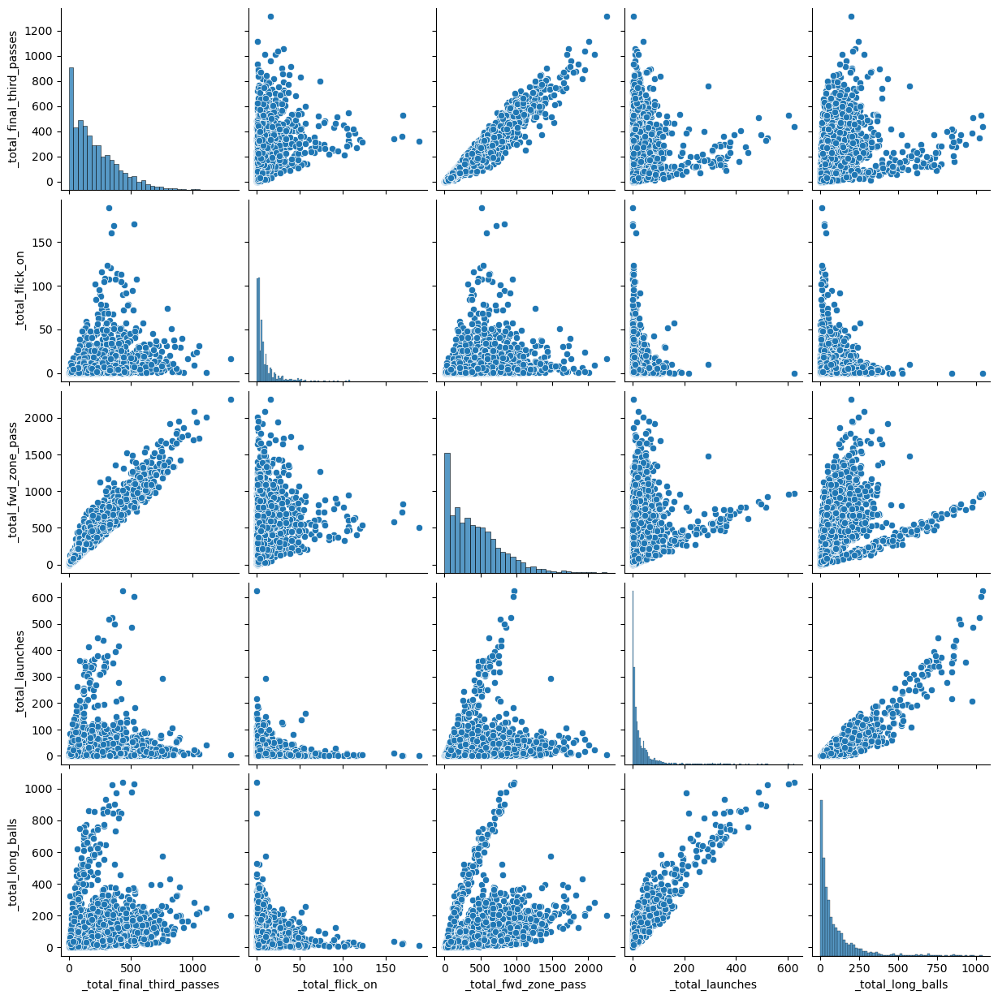

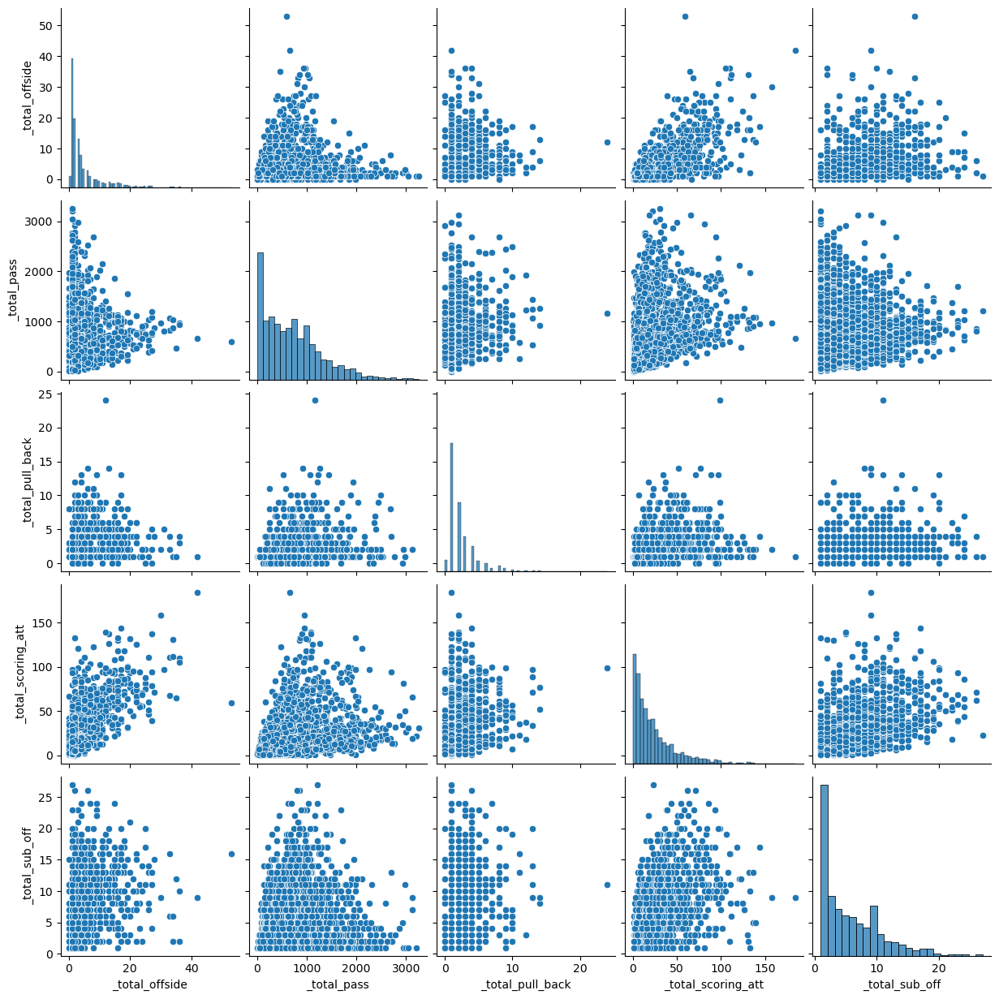

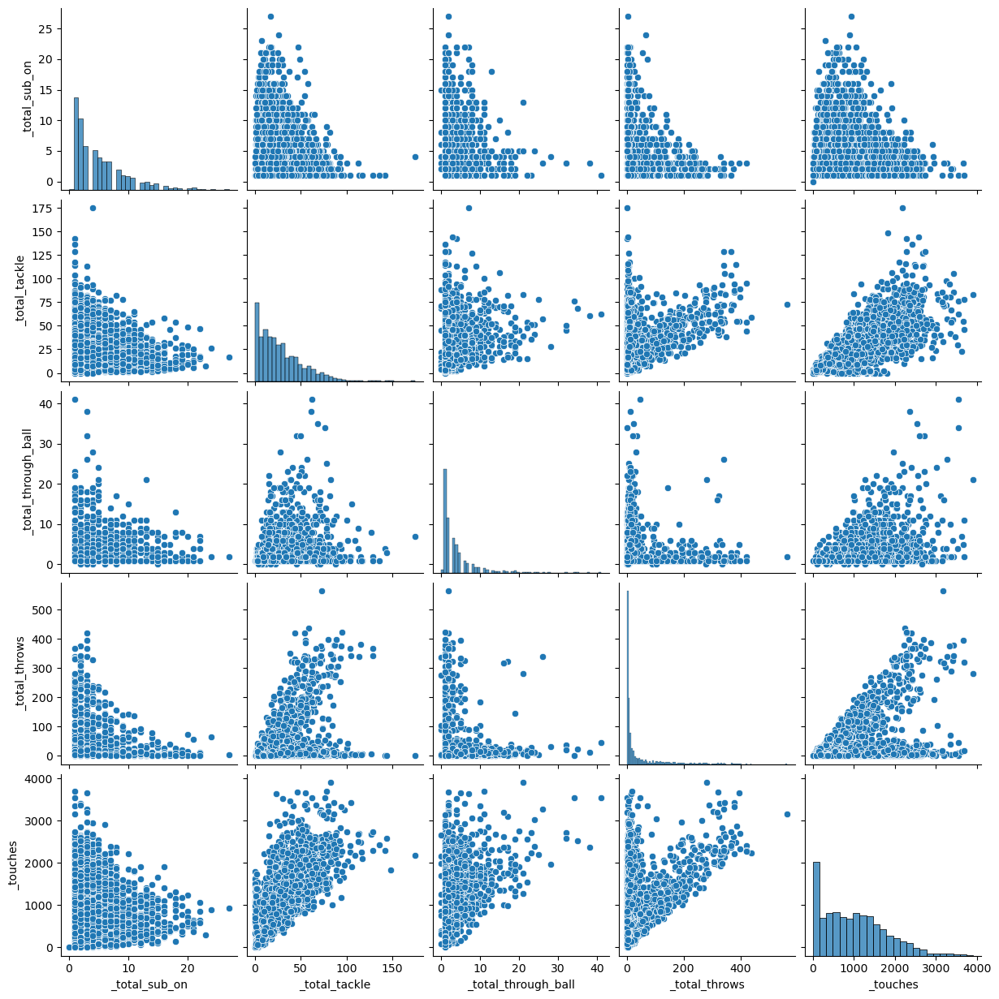

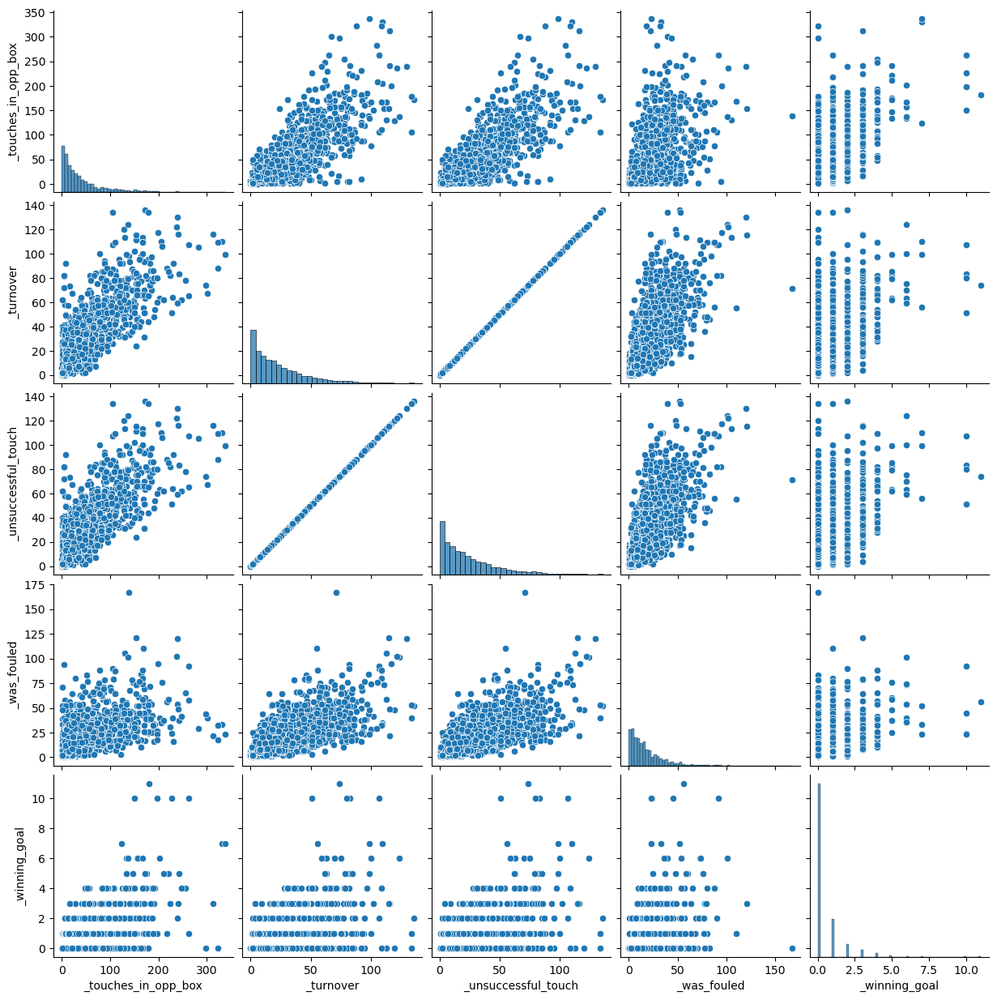

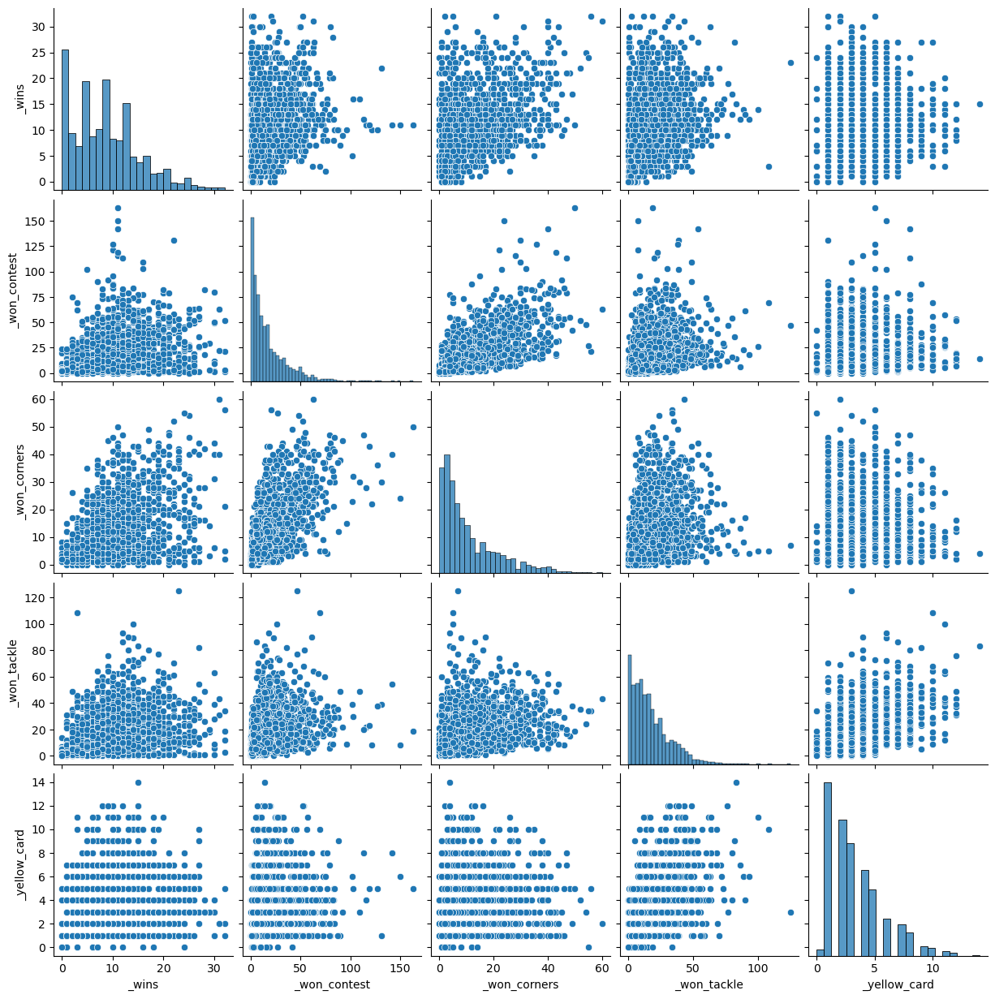

In [35]:
n = 5
df_new = df.iloc[:, 12:]
for col in range(2, df_new.shape[1]-n, n):
    loc_ =  list(range(col , col+n)) #Индексы колонок
    sns.pairplot(df_new.iloc[:, loc_])

In [36]:
df.to_csv(Path('eda_data/players_stat.csv').resolve(), index=False)